<h1>Analysis of dispatch model/Grimsel results<span class="tocSkip"></span></h1>

Companion notebook #4 of 4 of the paper 
>M.C.Soini *et al.*, **On the market displacement of incumbent grid-connected electricity storage by more efficient storage**.

The notebook is published as a static html file and as a Jupyter notebook file; please find the notebook file [here](https://github.com/mcsoini/storage_displacement_supplementary/blob/master/04_dispatch_model_analysis.ipynb).

This notebook performs all analyses presented in section 3.3 of the paper.

**Instructions**
* Install dependencies as defined in the [README](https://github.com/mcsoini/storage_displacement_supplementary/blob/master/README.md)
* This assumes the availability of the dispatch model/Grimsel results generated using a separate [Jupyter Notebook](https://github.com/mcsoini/storage_displacement_supplementary/blob/master/03_dispatch_model_run.ipynb).

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Imports-and-setup" data-toc-modified-id="Imports-and-setup-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Imports and setup</a></span><ul class="toc-item"><li><span><a href="#Auxiliary-tables-and-functions" data-toc-modified-id="Auxiliary-tables-and-functions-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Auxiliary tables and functions</a></span></li></ul></li><li><span><a href="#Displacement-of-storage" data-toc-modified-id="Displacement-of-storage-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Displacement of storage</a></span><ul class="toc-item"><li><span><a href="#Total-discharge-of-both-storage-types-by-season" data-toc-modified-id="Total-discharge-of-both-storage-types-by-season-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Total discharge of both storage types by season</a></span></li><li><span><a href="#Hourly-displacement-patterns" data-toc-modified-id="Hourly-displacement-patterns-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Hourly displacement patterns</a></span></li><li><span><a href="#Displacement-per-unit-of-installed-new-storage-capacity" data-toc-modified-id="Displacement-per-unit-of-installed-new-storage-capacity-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Displacement per unit of installed new storage capacity</a></span></li><li><span><a href="#Marginal-displacement" data-toc-modified-id="Marginal-displacement-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Marginal displacement</a></span></li><li><span><a href="#Average-displacement" data-toc-modified-id="Average-displacement-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Average displacement</a></span></li><li><span><a href="#Hourly-displacement-analysis" data-toc-modified-id="Hourly-displacement-analysis-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Hourly displacement analysis</a></span></li><li><span><a href="#Selected-case-of-high-BAT-PHS-operation" data-toc-modified-id="Selected-case-of-high-BAT-PHS-operation-2.7"><span class="toc-item-num">2.7&nbsp;&nbsp;</span>Selected case of high-BAT PHS operation</a></span></li></ul></li><li><span><a href="#Change-of-the-price-profiles" data-toc-modified-id="Change-of-the-price-profiles-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Change of the price profiles</a></span></li><li><span><a href="#Average-operation" data-toc-modified-id="Average-operation-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Average operation</a></span></li><li><span><a href="#Capacity-factor" data-toc-modified-id="Capacity-factor-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Capacity factor</a></span></li><li><span><a href="#Run-storedisagg" data-toc-modified-id="Run-storedisagg-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Run <em>storedisagg</em></a></span><ul class="toc-item"><li><span><a href="#Define-helper-functions" data-toc-modified-id="Define-helper-functions-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Define helper functions</a></span></li><li><span><a href="#Coarse-time-difference-bins" data-toc-modified-id="Coarse-time-difference-bins-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Coarse time difference bins</a></span></li><li><span><a href="#Aggregate-patterns-of-coarse-bins" data-toc-modified-id="Aggregate-patterns-of-coarse-bins-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Aggregate patterns of coarse bins</a></span></li><li><span><a href="#Correlation-with-wind-power-production-by-coarse-bin" data-toc-modified-id="Correlation-with-wind-power-production-by-coarse-bin-6.4"><span class="toc-item-num">6.4&nbsp;&nbsp;</span>Correlation with wind power production by coarse bin</a></span></li><li><span><a href="#Marginal-price-differences/ratios" data-toc-modified-id="Marginal-price-differences/ratios-6.5"><span class="toc-item-num">6.5&nbsp;&nbsp;</span>Marginal price differences/ratios</a></span></li></ul></li><li><span><a href="#Storage-properties" data-toc-modified-id="Storage-properties-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Storage properties</a></span></li><li><span><a href="#Model-results-consistency-check" data-toc-modified-id="Model-results-consistency-check-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Model results consistency check</a></span><ul class="toc-item"><li><span><a href="#Default;-future-scenarios" data-toc-modified-id="Default;-future-scenarios-8.1"><span class="toc-item-num">8.1&nbsp;&nbsp;</span>Default; future scenarios</a></span></li><li><span><a href="#Impact-of-swst_vl" data-toc-modified-id="Impact-of-swst_vl-8.2"><span class="toc-item-num">8.2&nbsp;&nbsp;</span>Impact of swst_vl</a></span></li><li><span><a href="#Verify-frozen-capacity" data-toc-modified-id="Verify-frozen-capacity-8.3"><span class="toc-item-num">8.3&nbsp;&nbsp;</span>Verify frozen capacity</a></span></li><li><span><a href="#Verify-frozen-prices" data-toc-modified-id="Verify-frozen-prices-8.4"><span class="toc-item-num">8.4&nbsp;&nbsp;</span>Verify frozen prices</a></span></li><li><span><a href="#Verify-new-storage-capacity-as-expected" data-toc-modified-id="Verify-new-storage-capacity-as-expected-8.5"><span class="toc-item-num">8.5&nbsp;&nbsp;</span>Verify new storage capacity as expected</a></span></li></ul></li><li><span><a href="#Other-analyses" data-toc-modified-id="Other-analyses-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Other analyses</a></span><ul class="toc-item"><li><span><a href="#Statistical-analysis-of-daily-residual-load/price-profiles" data-toc-modified-id="Statistical-analysis-of-daily-residual-load/price-profiles-9.1"><span class="toc-item-num">9.1&nbsp;&nbsp;</span>Statistical analysis of daily residual load/price profiles</a></span><ul class="toc-item"><li><span><a href="#Distribution-of-residual-load-by-hour-of-the-day" data-toc-modified-id="Distribution-of-residual-load-by-hour-of-the-day-9.1.1"><span class="toc-item-num">9.1.1&nbsp;&nbsp;</span>Distribution of residual load by hour of the day</a></span></li><li><span><a href="#Distribution-of-marginal-costs-by-hour-of-the-day" data-toc-modified-id="Distribution-of-marginal-costs-by-hour-of-the-day-9.1.2"><span class="toc-item-num">9.1.2&nbsp;&nbsp;</span>Distribution of marginal costs by hour of the day</a></span></li><li><span><a href="#Calculation-of-differences/ratios-between-the-four-coarse-day-times" data-toc-modified-id="Calculation-of-differences/ratios-between-the-four-coarse-day-times-9.1.3"><span class="toc-item-num">9.1.3&nbsp;&nbsp;</span>Calculation of differences/ratios between the four coarse day times</a></span><ul class="toc-item"><li><span><a href="#2D-plot-of-counts-at-certain-differences-day-night-and-morning-night" data-toc-modified-id="2D-plot-of-counts-at-certain-differences-day-night-and-morning-night-9.1.3.1"><span class="toc-item-num">9.1.3.1&nbsp;&nbsp;</span>2D plot of counts at certain differences day-night and morning-night</a></span></li><li><span><a href="#Histograms-of-ratios-and-differences" data-toc-modified-id="Histograms-of-ratios-and-differences-9.1.3.2"><span class="toc-item-num">9.1.3.2&nbsp;&nbsp;</span>Histograms of ratios and differences</a></span></li></ul></li></ul></li></ul></li></ul></div>

# Imports and setup

In [1]:
from dask.distributed import Client
client = Client(dashboard_address='127.0.0.1:41012', n_workers=10)
client

Client Scheduler: tcp://127.0.0.1:38509 Dashboard: http://127.0.0.1:41012/status,Cluster Workers: 10 Cores: 30 Memory: 133.72 GB


In [ ]:
import sys, os
import re
from glob import glob
import itertools
import functools
import numpy as np
import pandas as pd
import dask.dataframe as dd
import pandas as pd
from dask import delayed
from fastparquet import ParquetFile

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from IPython.display import Image

import grimsel.auxiliary.maps as maps

pd.option_context('mode.chained_assignment', None)

# Directory with model result parquet files
sc_out = 'out_grimsel/'

## Auxiliary tables and functions

In [3]:
print_full = pd.option_context('display.max_rows', None, 
                               'display.max_columns', None)

# conversion between ids and names of power plants, nodes, etc
mps = maps.Maps.from_parquet(sc_out)

# table defining model runs
def_run = pd.read_parquet(sc_out + 'def_run.parq')
# timemap table defining hours of the year
dict_mt2 = {mt: k for k, v in {'Summer': [4, 5, 6, 7, 8, 9],
                               'Winter': [0, 1, 2, 3, 10, 11]}.items() for mt in v}
df_tm_soy_full = (pd.read_parquet(sc_out + 'tm_soy_full.parq')
                    .assign(season2=lambda x: x.mt_id.replace(dict_mt2)))

# list of columns defining model variations
sw_cols = [c for c in def_run.columns if re.match('^sw.*vl$', c)]

def get_file_list(glob_in, slct_run_id=None):
    if not slct_run_id:
        slct_run_id = def_run.run_id
    
    files = [fn for fn in glob_in if any(fn.endswith('{:04d}.parq'.format(run_id)) for run_id in slct_run_id)]
    return sorted(files)

def ddf_from_parquet(pattern, slct_run_id=None, as_df=False, columns=None):
    '''Read all parquet files of a certain file name pattern with certain run_ids'''
    @delayed
    def load_chunk(pth, columns):
        return ParquetFile(pth).to_pandas(columns=columns)#.set_index('run_id')

    files = get_file_list(glob(sc_out + pattern), slct_run_id)
    assert len(files) > 0, f'Pattern {sc_out + pattern} yields empty file list.'
    ddf = dd.from_delayed([load_chunk(f, columns=columns) for f in files])
    if as_df:
        ddf = ddf.compute()
    
    return ddf
    
def ddf_add_tm_cols(ddf, tm_cols):
    '''Join timemap tables'''
    return ddf.join(df_tm_soy_full.set_index('sy')[tm_cols], on='sy')

# Displacement of storage
* Obtain a table of hourly storage charging and discharging for all `run_ids`
* join the reference values (i.e. all things equal with zero BAT capacity: `swst_vl == "000%"`)
* Calculate difference `value_diff` of storage operation with respect to reference case
* add additional time columns for future aggregation (i.e. by season)

In [4]:
# select susbet of years
slct_run_id = def_run.query('swfy_vl in  ["yr2015", "yr2035", "yr2050"]')

def join_swst_reference(ddf):
    slct_col_map = list(set(sw_cols) - {'swst_vl'})
    map_run_id = slct_run_id.join(slct_run_id.query('swst_vl == "000%"').set_index(slct_col_map).run_id.rename('run_id_ref'), 
                                  on=slct_col_map)[['run_id', 'run_id_ref']]
    return ddf.join(map_run_id.set_index('run_id'), on='run_id'), map_run_id

In [5]:
ddfpwr = ddf_from_parquet('var_sy_pwr*', slct_run_id=slct_run_id.run_id.tolist(),
                          columns=['sy', 'pp_id', 'value', 'bool_out', 'run_id'])
# only storage
ddfpwr = ddfpwr.loc[ddfpwr.pp_id.isin(mps.pp2pp('STO'))]
ddfpwr, map_run_id = join_swst_reference(ddfpwr)

## select reference values
ddfpwr_ref = ddfpwr.loc[ddfpwr.run_id == ddfpwr.run_id_ref].drop('run_id', axis=1).rename(columns={'value': 'value_ref'})

ddfpwr = dd.merge(ddfpwr.astype({'run_id_ref': np.int32}), 
                  ddfpwr_ref.astype({'run_id_ref': np.int32}), 
                  on=['sy', 'pp_id', 'run_id_ref', 'bool_out', ])

ddfpwr['value_diff'] = ddfpwr.value - ddfpwr.value_ref
ddfpwr['posflag'] = ddfpwr.value_diff > 0

dfpwrdiff_0 = ddfpwr.compute()
print('id_to_name')
dfpwrdiff_0 = mps.id_to_name(dfpwrdiff_0)
print('df_tm_soy_full')
dfpwrdiff_0 = dfpwrdiff_0.join(df_tm_soy_full.set_index('sy')[['hour', 'dow', 'dow_type', 'hom', 'doy', 'mt_id', 'season', 'season2']], on='sy')


id_to_name
df_tm_soy_full


## Total discharge of both storage types by season
* figure 13 a-b of the paper

In [6]:
dftotdch = (dfpwrdiff_0.loc[~dfpwrdiff_0.bool_out].groupby(['run_id', 'season2', 'pt'] + sw_cols).value.sum() * 1e-6).reset_index()

In [7]:
dfplot = dftotdch.loc[dftotdch.swfy_vl.isin(['yr2015', 'yr2035', 'yr2050'])]
dfplot['pt_fz'] = dfplot[['swfz_vl', 'pt']].apply('_'.join, axis=1)
fig = px.line(dfplot.query('swec_vl == "early_bat"')
                    .assign(ec_season=lambda x: x[['swec_vl', 'season2']].apply(tuple,axis=1).astype(str)),
       x='swst_vl', y='value', hover_data=[],
       facet_row=None, facet_col='swfy_vl', color='season2', line_group='pt_fz',
       labels={'value': 'Discharged energy (TWh/yr)',
               'swst_vl': 'New storage penetration (%)'})
fig

## Hourly displacement patterns

In [38]:
dfpwr = dfpwrdiff_0.loc[dfpwrdiff_0.swfy_vl.isin(['yr2015', 'yr2035', 'yr2050'])
                      & dfpwrdiff_0.swfz_vl.isin(['default'])
                      & dfpwrdiff_0.swst_vl.isin(["010%", "100%"])
               #   & dfpwr_0.pt.isin(['HYD_STO'])
                   ]
dfpwrpv = dfpwr.groupby(['bool_out', 'pt', 'posflag', 'hour', 'run_id'] + sw_cols).value_diff.sum().reset_index()
fig = px.line(dfpwrpv.assign(line_group=lambda x: x[['bool_out', 'pt', 'run_id']].apply(tuple, axis=1).astype(str)),
        x='hour', y='value_diff', hover_data=['bool_out'] + sw_cols,
        facet_col='swfy_vl', facet_row='posflag', line_group='line_group', color='swec_vl')
fig.update_yaxes(matches=None)

## Displacement per unit of installed new storage capacity

In [41]:
ddfcap = ddf_from_parquet('par_cap_pwr_leg*', columns=['pp_id', 'run_id', 'value'])
ddfcap = ddfcap.loc[ddfcap.pp_id.isin(mps.pp2pp('STO'))]
dfcap = ddfcap.compute().rename(columns={'value': 'cap'})

In [42]:
# displacement in units MWh/MW_NEWSTO/day
tm_cols = ['season2']
dfnhours = df_tm_soy_full.groupby(tm_cols).apply(len).rename('nhours')
dfcap_pt = dfcap.assign(pt_id=dfcap.pp_id.replace(mps.dict_plant_2_pp_type_id)).groupby(['pt_id', 'run_id']).cap.sum()
dfpwr_dispspec = (dfpwrdiff_0.loc[~dfpwrdiff_0.bool_out]
                       .groupby(['bool_out', 'run_id', 'pt_id', 'pt'] + tm_cols + sw_cols)[['value', 'value_diff', 'value_ref']]
                       .sum().reset_index()
                       .join(dfcap_pt, on=['pt_id', 'run_id'])
                       .join(dfnhours, on=dfnhours.index.names)
                 )

In [46]:
dfpwr_dispspec['dispspec_cap'] = (dfpwr_dispspec.value_diff / dfpwr_dispspec.cap / dfpwr_dispspec.nhours).fillna(0)
dfpwr_dispspec['cf'] = (dfpwr_dispspec.value / dfpwr_dispspec.cap / dfpwr_dispspec.nhours).fillna(0)
dfpwr_dispspec['pt_ec'] = dfpwr_dispspec[["pt", "swec_vl"]].apply('_'.join, axis=1)
dfpwr_dispspec['all_tm'] = dfpwr_dispspec[tm_cols].astype(str).apply('_'.join, axis=1)

dfpwr_dispspec.to_csv('DATA_OUT_CSV/table_dispspec_cap.csv')

px.line(dfpwr_dispspec.query('swfy_vl in ["yr2015", "yr2050"] '
                             'and swec_vl == "early_phs"').sort_values(['swfy_vl', 'run_id', 'pt', ]), 
        x='swst_vl', y='dispspec_cap', 
        hover_data=['run_id'],
        facet_col='swfz_vl', facet_row='swfy_vl', line_group='pt_ec', color='all_tm',
        labels={'dispspec_cap': 'BAT capacity impact (-)', 'swst_vl': 'BAT penetration (%)'})

## Marginal displacement
* Approximate marginal displacement
* Not shown in paper

In [52]:
dfpwr_dispspec_erg_marg = (dfpwr_dispspec.pivot_table(index=['run_id', 'all_tm'] + tm_cols, 
                                                      values='value', columns='pt', aggfunc='sum')
               .reset_index().join(def_run.set_index('run_id')[sw_cols], on='run_id')
               .assign(swst_vl=lambda x: x.swst_vl.apply(lambda y: int(y[:-1])))
               .set_index(list(set(sw_cols) | set(tm_cols + ['all_tm', 'run_id'])))
               .groupby(level=list((set(sw_cols) - {'swst_vl'}) | set(['all_tm'] + tm_cols))).apply(lambda df: df.diff())
               .assign(dispspec_erg=lambda x: x.HYD_STO / x.NEW_STO)
               .reset_index())
dfpwr_dispspec_erg_marg.to_csv('DATA_OUT_CSV/table_dispspec_marg.csv')

cols = [c for c in dfpwr_dispspec_erg_marg.columns 
        if not c in ['HYD_STO', 'NEW_STO', 'dispspec_erg', 'swst_vl', 'run_id', 'dispspec_erg_smooth']]
dfpwr_dispspec_erg_marg_smooth = (dfpwr_dispspec_erg_marg.groupby(cols)
                                          .apply(lambda df: df.set_index('swst_vl')[['dispspec_erg']].sort_index().rolling(5, min_periods=0).mean())
                                          .reset_index())

px.line(dfpwr_dispspec_erg_marg_smooth.query('swfy_vl in ["yr2015", "yr2050", "yr2035"] '
                                     # ' and swst_vl <= 150 '
                                      ' and swfz_vl == "default"').sort_values(['swfy_vl','swst_vl']), 
        x='swst_vl', y='dispspec_erg', hover_data=[], color='all_tm', 
        facet_col='swfy_vl', facet_row='swfz_vl', line_group='swec_vl', 
        labels={'dispspec_erg': 'Marginal BAT energy impact (MWh<sub>PHS</sub>/MWh<sub>BAT</sub>)', 
                'swst_vl': 'BAT penetration (%)'})

## Average displacement
* Average displacement of PHS per unit of BAT discharge energy 
* Figure 13 e-f in the paper

In [58]:
dfpwr_dispspec_erg = (dfpwr_dispspec.pivot_table(index=['run_id', 'all_tm'], 
                                                 values=['value_diff'], 
                                                 columns='pt', aggfunc='sum')
                        .value_diff.assign(dispspec_erg=lambda x: x.HYD_STO / x.NEW_STO))

dfpwr_dispspec_erg = mps.id_to_name(dfpwr_dispspec_erg.reset_index())

dfpwr_dispspec_erg.to_csv('DATA_OUT_CSV/table_dispspec_erg.csv')

In [65]:
dfpwr_dispspec_erg['color'] = (dfpwr_dispspec_erg.swfz_vl + '_' + dfpwr_dispspec_erg.all_tm + '_' + 
                               dfpwr_dispspec_erg.swfz_vl + '_' + dfpwr_dispspec_erg.swec_vl)
px.line(dfpwr_dispspec_erg.query('swfy_vl in ["yr2015", "yr2035", "yr2050"] '
                                 #' and swfz_vl == "default"'
                                 ).sort_values(['swfy_vl', 'run_id']), 
        x='swst_vl', y='dispspec_erg',
        hover_data=['run_id'], color='color',
        facet_col='swfy_vl', line_group='swec_vl',
        labels={'dispspec_erg': 'Average BAT energy impact (MWh<sub>PHS</sub>/MWh<sub>BAT</sub>)', 
                'swst_vl': 'BAT penetration (%)'})

## Hourly displacement analysis
* displacement by hour of the day
* not included in the paper

In [60]:
dfpwrdiff_hourly = (dfpwrdiff_0.query('swfy_vl in ["yr2015", "yr2050"] and swec_vl == "early_bat"')
                               .groupby(['hour', 'run_id', 'season2', 'fl', 'pt', 'dow_type', 'dow', 'bool_out'])
                               [['value', 'value_ref', 'value_diff']].sum().reset_index())
dfpwrdiff_hourly
dfpwrdiff_hourly = mps.id_to_name(dfpwrdiff_hourly)

In [69]:
dfpwrdiff_hourly_slct = dfpwrdiff_hourly.loc[dfpwrdiff_hourly.swfy_vl.isin(['yr2015', 'yr2050'])
                      & dfpwrdiff_hourly.swec_vl.isin(['early_bat'])
                      & dfpwrdiff_hourly.swfz_vl.isin(['default'])
                      & dfpwrdiff_hourly.pt.isin(['HYD_STO'])
                      & dfpwrdiff_hourly.dow_type.isin(['WEEKDAY'])
                      & dfpwrdiff_hourly.swst_vl.isin(['010%', '300%'])
                      & dfpwrdiff_hourly.fl.isin(['pumped_hydro'])]
dfpwrdiff_hourly_slct_agg = dfpwrdiff_hourly_slct.groupby(['swfy_vl', 'fl', 'swst_vl', 'season2', 'hour', 'dow_type', 'bool_out']).value_diff.apply(np.mean).reset_index()

fig = px.line(dfpwrdiff_hourly_slct_agg, 
        x='hour', y='value_diff', hover_data=['fl'], color='swfy_vl',
        facet_col='swst_vl', facet_row='bool_out', line_group='season2',
        labels={'value_diff': 'PHS power reduction (MWh<sub>PHS</sub>)', 
                'hour': 'Hour of the day'})
fig

## Selected case of high-BAT PHS operation
* Hourly production during a single month
* What does the detailed PHS dispatch look like under high BAT penetration?
* Not included in the paper

In [70]:
dfslct = dfpwrdiff_0.loc[dfpwrdiff_0.swst_vl.isin(['000%', '300%'])
                       & dfpwrdiff_0.swfz_vl.isin(['default'])
                       & dfpwrdiff_0.swec_vl.isin(['early_bat'])
                       & dfpwrdiff_0.swfy_vl.isin(['yr2035'])
                       ]

In [73]:
dfplot = (dfslct.query('pp == "DE_HYD_STO"')
                .pivot_table(index=['hom', 'bool_out', 'swst_vl'], values='value')
                .reset_index())

px.line(dfplot, x='hom', y='value', hover_data=[], color='bool_out',
        facet_col=None, facet_row='swst_vl', line_group='bool_out',
        labels={'value': 'PHS energy (MWh<sub>PHS</sub>)', 
                'hom': 'Hour of the month'})

# Change of the price profiles
* Figure 12 a-c in the paper


In [77]:
slct_run_id = def_run.query('swst_vl == "000%" and swec_vl == "early_phs"').run_id.tolist()

In [78]:
ddfdual = ddf_from_parquet('dual_supply*', columns=['sy', 'nd_id', 'value', 'run_id'], slct_run_id=slct_run_id)
ddfdual = ddfdual.compute().rename(columns={'value': 'price'})
ddfdmnd = ddf_from_parquet('par_dmnd*', columns=['sy', 'nd_id', 'value', 'run_id'], slct_run_id=slct_run_id)
ddfdmnd = ddfdmnd.compute().rename(columns={'value': 'dmnd'})

pddd = pd
ddfdual_weight = pd.merge(ddfdual, ddfdmnd, on=['sy', 'nd_id', 'run_id'])
ddfdual_weight['price_dmnd'] = ddfdual_weight.price * ddfdual_weight.dmnd
ddfdual_weight = ddfdual_weight.join(df_tm_soy_full.set_index('sy')[['hour', 'dow_type', 'season2']], on='sy')
ddfdual_weight = ddfdual_weight.loc[ddfdual_weight.dow_type == 'WEEKDAY']
tm_cols = ['hour']
ddfdual_weight = ddfdual_weight.groupby(['run_id'] + tm_cols)[['price_dmnd', 'dmnd']].sum().reset_index()

dfdual_weight = ddfdual_weight.compute() if pddd == dd else ddfdual_weight

In [86]:
dfdual_weight['price_weight'] = dfdual_weight.price_dmnd / dfdual_weight.dmnd
dfdual_weight['price_weight_shifted'] = dfdual_weight.groupby(['run_id'] + list(set(tm_cols) - {'hour'})).price_weight.apply(lambda x: x - x.mean())
dfdual_weight['price_weight_scaled'] = dfdual_weight.groupby(['run_id'] + list(set(tm_cols) - {'hour'})).price_weight.apply(lambda x: x / x.mean())
dfdual_weight = mps.id_to_name(dfdual_weight[['price_weight','price_weight_shifted', 'price_weight_scaled',
                                              'price_dmnd', 'dmnd', 'run_id'] + tm_cols])
dfdual_weight['season_yr'] = (#dfdual_weight.season2 + '_' +
                              dfdual_weight.swfy_vl)

dfdual_weight.to_csv('DATA_OUT_CSV/table_price_profiles.csv')

data = (dfdual_weight.query('swfy_vl in ["yr2015", "yr2035", "yr2050"] '
                           ' and swst_vl == "000%"')
                    .sort_values(['swfy_vl', 'hour', 'swfz_vl', 'run_id']))
fig = px.line(data, x='hour', y='price_weight_scaled', hover_data=['run_id', 'swec_vl', 'swst_vl'], 
              facet_col='swfz_vl', color='season_yr', 
              labels={'price_weight_scaled': 'Price normalized by mean (-)', 
                      'hour': 'Hour of the day'})
fig

# Average operation

* Average daily system dispatch
* Figure 12 g-r in the paper

In [87]:
slct_run_id = def_run.query('swst_vl in ["000%", "010%", "100%"] and swfz_vl == "default" '
                            ' and swfy_vl in ["yr2015", "yr2035", "yr2050"] and swec_vl == "early_bat"')

,tdiff_solve,tdiff_write,run_id,info,swfy_id,swfz_id,swst_id,swec_id,swch_id,swfy,swfz,swst,swec,swch,swfy_vl,swfz_vl,swst_vl,swec_vl,swch_vl,objective
744,270.485983,4.249160,744,Solver: optimal,0,0,0,1,0,0.0,0.0,0.0,1.0,0.0,yr2015,default,000%,early_bat,default,2.777866e+10
747,275.090349,4.255634,768,Solver: optimal,0,0,1,1,0,0.0,0.0,1.0,1.0,0.0,yr2015,default,010%,early_bat,default,2.774420e+10
774,260.868250,4.182237,984,Solver: optimal,0,0,10,1,0,0.0,0.0,10.0,1.0,0.0,yr2015,default,100%,early_bat,default,2.764789e+10
837,261.218879,4.764015,750,Solver: optimal,6,0,0,1,0,6.0,0.0,0.0,1.0,0.0,yr2035,default,000%,early_bat,default,7.591458e+10
840,277.835673,4.616914,774,Solver: optimal,6,0,1,1,0,6.0,0.0,1.0,1.0,0.0,yr2035,default,010%,early_bat,default,7.577207e+10
867,262.310919,4.254393,990,Solver: optimal,6,0,10,1,0,6.0,0.0,10.0,1.0,0.0,yr2035,default,100%,early_bat,default,7.529690e+10
1209,273.869415,4.307408,748,Solver: optimal,4,0,0,1,0,4.0,0.0,0.0,1.0,0.0,yr2050,default,000%,early_bat,default,1.043044e+11
1212,273.855464,4.520020,772,Solver: optimal,4,0,1,1,0,4.0,0.0,1.0,1.0,0.0,yr2050,default,010%,early_bat,default,1.040774e+11
1239,269.348777,4.963924,988,Solver: optimal,4,0,10,1,0,4.0,0.0,10.0,1.0,0.0,yr2050,default,100%,early_bat,default,1.031543e+11


In [89]:
ddfpwr = ddf_from_parquet('var_sy_pwr*', slct_run_id=slct_run_id.run_id.tolist())
ddfpwr['pt_id'] = ddfpwr.pp_id.replace(mps.dict_plant_2_pp_type_id)
ddfpwr['fl_id'] = ddfpwr.pp_id.replace(mps.dict_plant_2_fuel_id)
ddfpwr = ddfpwr.groupby(['sy', 'fl_id', 'bool_out', 'run_id']).value.sum().reset_index()
dfpwr_0 = ddfpwr.compute()

In [95]:
dfpwr = (mps.id_to_name(dfpwr_0).join(df_tm_soy_full.set_index('sy')[['hour', 'season2', 'dow_type']], on='sy')
                                 .query('dow_type == "WEEKDAY"')
                                 .pivot_table(index=['hour', 'season2', 'run_id', 'bool_out', 'swfy_vl', 'swst_vl', 'fl'],
                                            values='value', aggfunc=np.mean).reset_index()
                               )
dfpwr.loc[dfpwr.bool_out, 'value'] *= -1
dfpwr['st_season'] = dfpwr.season2 + '_' + dfpwr.swst_vl
dfpwr['fl_bool_out'] = dfpwr.fl + '_' + dfpwr.bool_out.astype(str)

dfpwr.to_csv('DATA_OUT_CSV/table_hourly_dispatch.csv')

def make_plot(qry=''):
    return px.area(dfpwr.query('fl not in ["dmnd", "lost_load"] and swfy_vl in ["yr2015", "yr2050"]' + qry),
                      x='hour', y='value', facet_col='st_season', facet_row='swfy_vl',
                      line_group='fl_bool_out', color='fl_bool_out',
                      labels={'value': 'Average power (MW)', 
                              'hour': 'Hour of the day'})

display(make_plot())
display(make_plot(' and fl in ["new_storage", "pumped_hydro"]'))

# Capacity factor
* figure 12 d-f in the paper

In [15]:
slct_run_id = def_run.query('swst_vl in ["000%", "010%", "050%", "100%"]').run_id.tolist()

In [16]:
ddfpwr = ddf_from_parquet('var_sy_pwr*', slct_run_id=slct_run_id, 
                          columns=['sy', 'run_id', 'pp_id', 'value', 'bool_out'])
ddfpwr = ddfpwr.loc[ddfpwr.pp_id.isin(mps.pp2pp('STO'))
                   & ~ddfpwr.bool_out]
ddfpwr['pt_id'] = ddfpwr.pp_id.replace(mps.dict_plant_2_pp_type_id)
ddfpwr = ddfpwr.groupby(['sy', 'pt_id', 'bool_out', 'run_id']).value.sum().reset_index()
dfpwr_0 = ddfpwr.compute()

In [17]:
dfpwr = dfpwr_0.copy()

ddfcap = ddf_from_parquet('par_cap_pwr_leg*', slct_run_id=slct_run_id)
ddfcap = ddfcap.loc[ddfcap.pp_id.isin(mps.pp2pp('STO'))]
dfcap = ddfcap.compute()
dfcap = mps.id_to_name(dfcap)
dfcap = dfcap.groupby(['run_id', 'pt_id']).value.sum().rename('cap')

dfcf = (dfpwr.join(df_tm_soy_full.set_index('sy')['season2'], on='sy')
             .loc[~dfpwr.bool_out]
             .groupby(['pt_id', 'run_id', 'bool_out'])
             .value.sum().rename('sum').reset_index()
             .join(dfcap, dfcap.index.names))
dfcf = mps.id_to_name(dfcf)

tm_cols_cf = list(set(df_tm_soy_full.columns) & set(dfcf.columns))
if tm_cols_cf:
    dfcf = dfcf.join(df_tm_soy_full.groupby(tm_cols_cf).apply(len).rename('len'), on=tm_cols_cf)
else:
    dfcf['len'] = len(df_tm_soy_full)  # <- 8760

In [18]:
dfcf['cf'] = dfcf['sum'] / (dfcf['len'] * dfcf.cap)
dfcf.to_csv('DATA_OUT_CSV/table_cf.csv')

fig = px.line(dfcf.query('swst_vl in ["000%", "010%",  "050%", ] and swfy_vl <= "yr2050" and swec_vl == "early_phs"').sort_values(['swst_vl', 'swfy_vl', 'swec_vl']), 
              x='swfy_vl', y='cf', hover_data=['run_id', 'swec_vl'],
              facet_col='swfz_vl', line_group='swst_vl', color='pt',
              labels={'swfy_vl': 'Year', 'cf': 'Discharging capacity factor (-)'})

fig.update_yaxes(range=[0, 0.12])

# Run *storedisagg*

In [64]:
import storedisagg
storedisagg.__file__

/home/martinsoini/.conda/envs/grimsel_symenergy_env/lib/python3.8/site-packages/tqdm/std.py:666: FutureWarning:

The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version



'/home/martinsoini/.conda/envs/grimsel_symenergy_env/lib/python3.8/site-packages/storedisagg/__init__.py'

## Define helper functions

In [65]:
def run_std(x):
    name, x = x
    dict_tot = x[['dch', 'chg']].sum().to_dict()
    assert dict_tot['chg'] > 0, str((name, x))
    eff = dict_tot['dch'] / dict_tot['chg']
    std = storedisagg.StDisaggregator(x, eff, 'share', print_progress=False)
    std.run()
    return (std.df_full_stacked.assign(**dict(zip(group_levels, name))), 
            std.df_step_evts.assign(**dict(zip(group_levels, name))))

def get_full_result_tables(results, group_levels, sw_cols, index_cols):
    
    
    df_step_0 = pd.concat([res[1] for res in results], axis=0, sort=False).assign(is_empty=lambda x: x.time_diff_icd.isna())
    df_full_0 = pd.concat([res[0] for res in results], axis=0, sort=False).join(df_step_0.set_index(list(index_cols)).is_empty, on=list(index_cols))

    df_step_0 = df_step_0.loc[~df_step_0.is_empty]
    df_full_0 = df_full_0.loc[~df_full_0.is_empty]

    df_step_0 = df_step_0.assign(comp_echg=lambda x: x.comp_ichg / np.sqrt(x.eff),
                                 comp_edch=lambda x: x.comp_idch * np.sqrt(x.eff))
    
    return df_step_0, df_full_0

In [67]:
slct_run_id = def_run.query('(swst_vl <= "100%" or swst_vl in ["100%", "150%", "200%", "250%", "300%"])'  
                            ' and swfy_vl in ["yr2015", "yr2035", "yr2050"]'
                            ' and swfz_vl == "default"').reset_index(drop=True)
group_levels = sw_cols + ['run_id', 'pt']
index_cols = (set(group_levels) - set(sw_cols)) | set(['nevent'])

In [68]:
dfpwr_0 = ddf_from_parquet('var_sy_pwr_*', slct_run_id=slct_run_id.run_id.tolist(), 
                           columns=['sy', 'pp_id', 'value', 'bool_out', 'run_id'])
dfpwr_0 = dfpwr_0.loc[dfpwr_0.pp_id.isin(mps.pp2pp('STO'))]
dfpwr_0['pt_id'] = dfpwr_0.pp_id.replace(mps.dict_plant_2_pp_type_id)
dfpwr_0 = dfpwr_0.groupby(['sy', 'pt_id', 'bool_out', 'run_id'])[['value']].sum()#.reset_index().set_index(['run_id'])

dfpwr_0 = mps.id_to_name(dfpwr_0.compute().reset_index())

In [69]:
dfpwr = dfpwr_0.copy()
dfpwr_gp = (dfpwr.pivot_table(index=sw_cols + ['run_id', 'pt', 'sy'],
                        columns='bool_out', values='value', aggfunc='sum')
                 .rename(columns={False: 'dch', True: 'chg'})
                 .reset_index('sy')
                 .rename(columns={'sy': 't'}))

# skip NEW_STO in case capacity is zero
dfpwr_gp = dfpwr_gp.loc[~((dfpwr_gp.index.get_level_values('swst_vl').isin(['000%', '0.0%']))
                        & (dfpwr_gp.index.get_level_values('pt') == 'NEW_STO'))]

list_gp = list(dfpwr_gp.groupby(level=group_levels))

In [70]:
from multiprocessing import Pool
storedisagg.logger.setLevel('ERROR')

with Pool(24) as pool:
    results = pool.map(run_std, list_gp)

In [71]:
df_step_0, df_full_0 = get_full_result_tables(results, group_levels, sw_cols, index_cols)

sys.exit()  # accidental overwrite protection

df_step_0.to_parquet('df_step_0_disagg_analysis.parquet', compression='gzip')
df_full_0.to_parquet('df_full_0_disagg_analysis.parquet', compression='gzip')

SystemExit: 

/home/martinsoini/.conda/envs/grimsel_symenergy_env/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3339: UserWarning:

To exit: use 'exit', 'quit', or Ctrl-D.



In [59]:
df_step_0 = pd.read_parquet('df_step_0_disagg_analysis.parquet')
df_full_0 = pd.read_parquet('df_full_0_disagg_analysis.parquet')

In [72]:
df_step_0 = df_step_0[group_levels + ['nevent', 'iteration', 'comp_ichg', 'comp_idch', 'comp_echg', 'comp_edch', 
                                      'wgt_center_erg_ichg', 'time_diff_icd']].reset_index(drop=True)
df_step_0['bin_coarse'] = pd.cut(df_step_0.time_diff_icd, [0, 6, 12, 24, 48, 168, 10000]).astype(str)
df_step_0['bin_fine'] = pd.cut(df_step_0.time_diff_icd, np.arange(-1 / 2, 500.5, 1)).apply(lambda x: x.mid).astype(float).fillna(500)
df_step_0['comp_sy_chg'] = df_step_0.wgt_center_erg_ichg.round().astype(int)
df_step_0.drop('time_diff_icd', axis=1, inplace=True)
df_step_0 = df_step_0.join(df_tm_soy_full.rename(columns={'sy': 'comp_sy_chg'}
                                                ).set_index('comp_sy_chg')[['season2']], on='comp_sy_chg')

df_full_0 = df_full_0.join(df_step_0.set_index(['pt', 'run_id', 'nevent'])[['bin_coarse', 'bin_fine']], 
                           on=['pt', 'run_id', 'nevent'])
df_full = df_full_0.copy()
df_step = df_step_0.copy()

In [73]:
df_step_hist = df_step.groupby(group_levels + ['bin_fine']).comp_ichg.sum().fillna(0).reset_index()
df_step_hist['comp_ichg_norm'] = df_step_hist.groupby(list(set(index_cols) - set(['nevent']))).comp_ichg.apply(lambda x: x/x.sum())

df_step_hist.to_csv('DATA_OUT_CSV/table_step_hist.csv')

In [74]:
fig = px.bar(df_step_hist.query('swfz_vl == "default" '
                                ' and pt in ["HYD_STO"] '
                                ' and swst_vl in ["000%", "010%"] '
                                'and swfy_vl in ["yr2015", "yr2035", "yr2050"] '
                                'and swst_vl in ["000%", "010%", "020%", "050%", "100%", "200%"]'
                                ).assign(year_ec=df_step_hist[['swfy_vl', 'swec_vl']].apply(tuple, axis=1),
                                         pt_year=df_step_hist[['pt', 'swfy_vl']].apply(tuple, axis=1),
                                         pt_season=df_step_hist[['pt']].apply(tuple, axis=1)), 
              x='bin_fine', y='comp_ichg', hover_data=['pt', 'swec_vl'], 
              facet_col='pt_year', facet_row='swst_vl', #line_group='swfy_vl',
              color='swec_vl', height=1000)
fig.update_layout(barmode='overlay', xaxis={'range': (0, 48)})
fig.update_traces(opacity=0.5)

## Coarse time difference bins
* figure 14 i-p in the paper

In [76]:
df_coarse = (df_step.query('bin_coarse != "nan"')
                    .groupby(sw_cols + ['run_id', 'bin_coarse', 'pt'])[['comp_ichg']].sum()
                    .reset_index().sort_values('run_id')
                    .assign(comp_ichg_norm=lambda df: df.groupby(['run_id', 'pt']).comp_ichg.apply(lambda x: x / x.sum())))

df_coarse.to_csv('DATA_OUT_CSV/table_disagg_coarse.csv')

df_coarse['pt_ec'] = df_coarse[['pt', 'swec_vl']].apply('_'.join, axis=1)
df_coarse = df_coarse.sort_values('pt_ec')

fig = px.bar(df_coarse.query('swfz_vl == "default"'
                             ' and swfy_vl in ["yr2015", "yr2035", "yr2050"]'
                            ).sort_values(['pt_ec', 'swfy_vl', 'run_id']),
             x='swst_vl', y='comp_ichg_norm', facet_col='pt_ec', facet_row='swfy_vl',
             color='bin_coarse', height=500)
fig.update_yaxes(matches=None)

In [142]:
(
    df_step.groupby(['run_id', 'pt'])[['comp_ichg', 'comp_idch']].sum(), 
    df_full.groupby(['run_id', 'pt'])[['ichg', 'idch']].sum(),
    dfpwr_gp.query('run_id == 0 and pt == "HYD_STO"').sum() * np.sqrt(0.75)
)

#df_step.query('run_id == 0 and pt == "HYD_STO"').comp_ichg.sum()

(                   comp_ichg     comp_idch
 run_id pt                                 
 0      HYD_STO  1.397169e+07  1.397169e+07
 4      HYD_STO  1.421700e+07  1.421700e+07
 6      HYD_STO  1.315281e+07  1.315281e+07
 24     HYD_STO  1.064812e+07  1.064812e+07
        NEW_STO  5.175817e+06  5.175817e+06
 ...                      ...           ...
 1464   NEW_STO  2.506324e+07  2.506324e+07
 1468   HYD_STO  1.872458e+06  1.872458e+06
        NEW_STO  3.449464e+07  3.449464e+07
 1470   HYD_STO  1.920232e+06  1.920232e+06
        NEW_STO  2.668365e+07  2.668365e+07
 
 [174 rows x 2 columns],                         ichg          idch
 run_id pt                                 
 0      HYD_STO  1.397169e+07  1.397169e+07
 4      HYD_STO  1.421700e+07  1.421700e+07
 6      HYD_STO  1.315281e+07  1.315281e+07
 24     HYD_STO  1.064812e+07  1.064812e+07
        NEW_STO  5.175817e+06  5.175817e+06
 ...                      ...           ...
 1464   NEW_STO  2.506324e+07  2.506324e+07
 1468 

In [112]:
# check total binned values
dfnet = dfpwr.pivot_table(index=['sy', 'run_id', 'pt'], columns=['bool_out'], 
                          aggfunc=sum, values='value'
                         ).reset_index().assign(eff=lambda x: x.reset_index().pt.replace({'HYD_STO': 0.75, 'NEW_STO': 0.9}),
                                                net=lambda x: x[False] / np.sqrt(x.eff) - x[True] * np.sqrt(x.eff))
#dfnet[False] = dfnet.net.where(dfnet.net > 0, 0) 
#dfnet[True] = - dfnet.net.where(dfnet.net < 0, 0) 
#
#dfnet = dfnet.groupby(['run_id', 'pt'])[[True, False]].sum()

dfnet.groupby(['pt', 'run_id'])[[True, False]].sum()

#with print_full:
#    display(
#    pd.merge(
#        df_step.groupby(['run_id', 'pt']).comp_idch.sum().reset_index(),
#        dfnet.reset_index(),
#        on=['run_id', 'pt']).assign(dev=lambda y: y.apply(lambda x: f'{(x.comp_idch - x[False]) / x[False] * 100:.2f}%', axis=1))
#    )

bool_out               True          False
pt      run_id                            
HYD_STO 0       1.707289e+07  1.280467e+07
        4       1.654028e+07  1.240521e+07
        6       1.557058e+07  1.167793e+07
        24      1.265411e+07  9.490579e+06
        28      1.404007e+07  1.053005e+07
...                      ...           ...
NEW_STO 1348    3.574641e+07  3.217177e+07
        1350    2.854861e+07  2.569375e+07
        1464    2.815347e+07  2.533813e+07
        1468    3.722606e+07  3.350346e+07
        1470    2.968418e+07  2.671577e+07

[180 rows x 2 columns]

## Aggregate patterns of coarse bins
* central panels in figure 14

In [77]:
df_full_plot = (df_full.loc[(df_full.swfz_vl == "default")
                          & (df_full.swst_vl.isin(["000%", "010%", "050%", "100%", "200%", "300%"]))]
                       .rename(columns={'t_orig': 'sy'})
                       .join(df_tm_soy_full.set_index('sy')[['hour', 'how']], on='sy'))

group_cols = ['hour', 'run_id', 'pt', 'bin_coarse'] + sw_cols
df_full_plot_hourly = (df_full_plot.groupby(group_cols)[['ichg', 'idch']]
                                   .sum().stack().rename('value').reset_index().rename(columns={f'level_{len(group_cols)}': 'cd'}))
group_cols_weekly = ['how', 'run_id', 'pt', 'bin_coarse'] + sw_cols
df_full_plot_weekly = (df_full_plot.groupby(group_cols_weekly)[['ichg', 'idch']]
                                   .sum().stack().rename('value').reset_index().rename(columns={f'level_{len(group_cols)}': 'cd'}))
df_full_plot_hourly.to_csv('DATA_OUT_CSV/table_df_full_for_patterns_hourly.csv')
df_full_plot_weekly.to_csv('DATA_OUT_CSV/table_df_full_for_patterns_weekly.csv')

In [78]:
fig = px.line(df_full_plot_hourly.query('swst_vl == "010%" and pt == "NEW_STO"'),# and swst_vl in ["000%", "010%", "100%"]'),
              x='hour', y='value',
              hover_data=['pt'], facet_col='swfy_vl', facet_row='bin_coarse',
              line_group='swec_vl', color='cd', height=1000)
fig.update_yaxes(matches=None)

## Correlation with wind power production by coarse bin
* analyze correlation between charging power profile and wind/solar production profiles for each coarse time difference bin
* not used in the paper

In [87]:
df_full_coarse_comp = (df_full_0.groupby(['t_orig', 'run_id', 'bin_coarse', 'pt'])[['ichg', 'idch']]
                                .sum().reset_index().rename(columns={'t_orig': 'sy'}))

In [81]:
ddfpwr_VRE = ddf_from_parquet('var_sy_pwr*', columns=['sy', 'pp_id', 'run_id', 'value'],
                              slct_run_id=slct_run_id.run_id.tolist())
ddfpwr_VRE = ddfpwr_VRE.loc[ddfpwr_VRE.pp_id.isin(mps.pp2pp('WIN|SOL'))]
ddfpwr_VRE['pt_id'] = ddfpwr_VRE.pp_id.replace(mps.dict_plant_2_pp_type)
ddfpwr_VRE = ddfpwr_VRE.groupby(['pt_id', 'sy', 'run_id']).value.sum().rename('pwr').reset_index()
dfpwr_VRE_0 = ddfpwr_VRE.compute()

In [82]:
dfpwr_VRE = (dfpwr_VRE_0.assign(pt=lambda x: x.pt_id.replace(mps.dict_pt))
                      .pivot_table(index=['run_id', 'sy'], values='pwr', columns='pt'))
dfpwr_VRE['wind_total'] = dfpwr_VRE.WIN_OFF + dfpwr_VRE.WIN_ONS
dfpwr_VRE = dfpwr_VRE.drop(['WIN_ONS', 'WIN_OFF'], axis=1).rename(columns={'SOL_PHO': 'solar'}).reset_index()

In [88]:
df_full_coarse_comp = mps.id_to_name(df_full_coarse_comp.join(dfpwr_VRE.set_index(['sy', 'run_id']), on=['sy', 'run_id']))
# get correlations
df_full_coarse_comp = df_full_coarse_comp.groupby(['run_id', 'bin_coarse', 'pt'])[['wind_total', 'solar', 'ichg', 'idch']].corr()

In [89]:
x = mps.id_to_name(df_full_coarse_comp.reset_index('run_id'))
x.index = x.index.rename(['pt', 'bin_coarse', 'profile'])

x.to_csv('DATA_OUT_CSV/table_correlation_chgdch_vre.csv')

x = x.reset_index()

x['year_profile'] = x[['swfy_vl', 'profile']].apply('_'.join, axis=1)

fig = px.line(x.query('profile not in ["idch", "ichg"] and swec_vl == "early_phs" and swfy_vl in ["yr2020", "yr2035"]'
                                   ).sort_values(['swst_vl', 'swfy_vl']),
              x='swst_vl', y='ichg', facet_col='year_profile', color='pt', 
              facet_row='bin_coarse', height=600)
fig

## Marginal price differences/ratios

Assess the marginal price differences/ratios between charging and discharging. This needs to make use of the storage operation disaggregation.

We are interested in the BAT dependence for the default parameter configurations otherwise:

In [12]:
slct_run_id = def_run.query('swst_vl <= "300%"'
                            ' and swfy_vl in ["yr2015", "yr2020", "yr2025", "yr2030", "yr2035"]'
                            ' and swec_vl == "early_phs"'
                            ' and swfz_vl == "default"').reset_index(drop=True)
slct_run_id

,tdiff_solve,tdiff_write,run_id,info,swfy_id,swfz_id,swst_id,swec_id,swch_id,swfy,swfz,swst,swec,swch,swfy_vl,swfz_vl,swst_vl,swec_vl,swch_vl,objective
0,412.385528,5.645435,1,Solver: optimal,1,0,0,0,0,1.0,0.0,0.0,0.0,0.0,yr2020,default,000%,early_phs,default,3.905056e+10
1,420.068512,6.936081,25,Solver: optimal,1,0,1,0,0,1.0,0.0,1.0,0.0,0.0,yr2020,default,010%,early_phs,default,3.893491e+10
2,434.475253,5.197031,49,Solver: optimal,1,0,2,0,0,1.0,0.0,2.0,0.0,0.0,yr2020,default,020%,early_phs,default,3.887009e+10
3,429.770412,7.427605,73,Solver: optimal,1,0,3,0,0,1.0,0.0,3.0,0.0,0.0,yr2020,default,030%,early_phs,default,3.882611e+10
4,422.847759,8.341161,97,Solver: optimal,1,0,4,0,0,1.0,0.0,4.0,0.0,0.0,yr2020,default,040%,early_phs,default,3.879179e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,258.304734,4.416086,630,Solver: optimal,6,0,26,0,0,6.0,0.0,26.0,0.0,0.0,yr2035,default,260%,early_phs,default,7.461303e+10
151,261.943172,4.351807,654,Solver: optimal,6,0,27,0,0,6.0,0.0,27.0,0.0,0.0,yr2035,default,270%,early_phs,default,7.459801e+10
152,261.784350,4.461420,678,Solver: optimal,6,0,28,0,0,6.0,0.0,28.0,0.0,0.0,yr2035,default,280%,early_phs,default,7.458393e+10
153,262.735493,4.417218,702,Solver: optimal,6,0,29,0,0,6.0,0.0,29.0,0.0,0.0,yr2035,default,290%,early_phs,default,7.457032e+10


In [5]:
dfpwr_0 = ddf_from_parquet('var_sy_pwr_*', slct_run_id=slct_run_id.run_id.tolist(), 
                           columns=['sy', 'pp_id', 'value', 'bool_out', 'run_id'])
dfpwr_0 = dfpwr_0.loc[dfpwr_0.pp_id.isin(mps.pp2pp('STO'))]
dfpwr_0 = dfpwr_0.compute()

In [6]:
dfpwr = dfpwr_0.copy()
dfpwr_gp = (dfpwr.pivot_table(index=['run_id', 'pp_id', 'sy'],
                              columns='bool_out', values='value', aggfunc='sum')
                 .rename(columns={False: 'dch', True: 'chg'})
                 .reset_index('sy')
                 .rename(columns={'sy': 't'}))

# skip NEW_STO in case capacity is zero
list_run_id_swst_zero = def_run.query('swst_vl == "000%"').run_id.tolist()
dfpwr_gp = dfpwr_gp.loc[~((dfpwr_gp.index.get_level_values('run_id').isin(list_run_id_swst_zero))
                        & (dfpwr_gp.index.get_level_values('pp_id').isin(mps.pp2pp('NEW_STO'))))]

# perform the disaggregation for each *plant* separately, i.e. don't aggregate all PHS
# plants in the five countries
group_levels = ['run_id', 'pp_id']
list_gp = list(dfpwr_gp.groupby(level=group_levels))

In [11]:
# parallel disaggregation of the storage operation by model run and power plant id
from multiprocessing import Pool
storedisagg.logger.setLevel('ERROR')

with Pool(24) as pool:
    results = pool.map(run_std, list_gp)

/home/martinsoini/.conda/envs/grimsel_value/lib/python3.6/site-packages/storedisagg/compcalc.py:84: RuntimeWarning:

invalid value encountered in true_divide

/home/martinsoini/.conda/envs/grimsel_value/lib/python3.6/site-packages/storedisagg/compcalc.py:84: RuntimeWarning:

invalid value encountered in true_divide

/home/martinsoini/.conda/envs/grimsel_value/lib/python3.6/site-packages/storedisagg/compcalc.py:84: RuntimeWarning:

invalid value encountered in true_divide

/home/martinsoini/.conda/envs/grimsel_value/lib/python3.6/site-packages/storedisagg/compcalc.py:84: RuntimeWarning:

invalid value encountered in true_divide

/home/martinsoini/.conda/envs/grimsel_value/lib/python3.6/site-packages/storedisagg/compcalc.py:84: RuntimeWarning:

invalid value encountered in true_divide

/home/martinsoini/.conda/envs/grimsel_value/lib/python3.6/site-packages/storedisagg/compcalc.py:84: RuntimeWarning:

invalid value encountered in true_divide

/home/martinsoini/.conda/envs/grimsel_value/li

In [13]:
# aggregate results 
index_cols = (set(group_levels) - set(sw_cols)) | set(['nevent'])
df_step_0, df_full_0 = get_full_result_tables(results, group_levels, sw_cols, index_cols)
df_full_0['nd_id'] = df_full_0.pp_id.replace(mps.dict_plant_2_node_id)

sys.exit()  # accidental overwrite protection

df_step_0.to_parquet('df_step_0_price_differences.parquet', compression='gzip')
df_full_0.to_parquet('df_full_0_price_differences.parquet', compression='gzip')

,comp_ichg,comp_idch,ichg,idch,iteration,min,nevent,res_ichg,res_idch,t_max,...,kind,wgt_center_erg_ichg,wgt_center_erg_idch,time_diff_icd,eff,run_id,pp_id,is_empty,comp_echg,comp_edch
nevent_index,,,,,,,,,,,,,,,,,,,,,
1.0,296.676087,296.676087,296.676582,296.676087,0,296.676087,1.0,0.000000,0.000000,1.0,...,share,0.000000,1.000000,1.000000,0.75,0,57,False,342.572038,256.929028
2.0,20517.693891,20517.693891,34631.644079,20517.693891,0,20517.693891,2.0,14113.950188,0.000000,22.0,...,share,6.858595,20.210595,13.352000,0.75,0,57,False,23691.792183,17768.844137
3.0,32683.435057,32683.435057,32683.435057,46797.385725,0,32683.435057,3.0,0.000000,14113.950667,50.0,...,share,28.605786,43.731098,15.125312,0.75,0,57,False,37739.580057,28304.685043
4.0,0.000004,0.000004,46374.514569,0.000004,0,0.000004,4.0,46374.514565,0.000000,63.0,...,share,56.257781,63.000000,6.742219,0.75,0,57,False,0.000004,0.000003
5.0,422.871523,422.871523,422.871523,15650.219831,0,422.871523,5.0,0.000000,15227.348307,74.0,...,share,64.904215,70.778498,5.874283,0.75,0,57,False,488.289975,366.217482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763.0,0.001277,0.001277,0.002403,0.001277,3,0.001277,763.0,0.001127,0.000000,5597.0,...,share,5195.819515,5410.931670,215.112155,0.90,726,76,False,0.001346,0.001211
764.0,0.001332,0.001332,0.002118,0.001332,3,0.001332,764.0,0.000000,0.000000,6454.0,...,share,5892.866090,5880.939942,-11.926148,0.90,726,76,False,0.001404,0.001263
765.0,122.105903,122.105903,122.105903,122.108371,3,122.105903,765.0,0.000000,0.002469,7439.0,...,share,6488.313185,6593.008912,104.695728,0.90,726,76,False,128.710923,115.839830


In [16]:
# load previous results
df_step_0 = pd.read_parquet('df_step_0_price_differences.parquet')
df_full_0 = pd.read_parquet('df_full_0_price_differences.parquet')

In [20]:
# stack full output table by charging/discharging (are separate column in storedisagg results)
df_full_melt = df_full_0.melt(id_vars=['t_orig', 'nevent', 'nd_id', 'run_id', 'pp_id'], 
                              value_vars=['ichg', 'idch'], value_name='pwr', var_name='chgdch')

# add marginal cost to the full output table
dfmc = ddf_from_parquet('dual_supply*', slct_run_id=slct_run_id.run_id.tolist()).compute()
dfmc = dfmc.rename(columns={'sy': 't_orig'}).set_index(['nd_id', 't_orig', 'run_id']).value.rename('mc')
df_full_mc = df_full_melt.join(dfmc, on=dfmc.index.names)

df_full_mc.head()

,t_orig,nevent,nd_id,run_id,pp_id,chgdch,pwr,mc
0,20,1.0,2,0,57,ichg,296.676087,18.735399
1,20,632.0,2,0,57,ichg,0.000495,18.735399
2,20,780.0,2,0,57,ichg,0.000000,18.735399
3,21,1.0,2,0,57,ichg,0.000000,26.796001
4,21,632.0,2,0,57,ichg,0.000000,26.796001


In [21]:
# calculate product of prices `mc` and chg/dch power for later calculation of weighted average mc
df_full_mc_avg = (df_full_mc.assign(mc_pwr=df_full_mc.pwr * df_full_mc.mc)
                            .groupby(['pp_id', 'chgdch', 'run_id', 'nevent'])[['mc_pwr', 'pwr']].sum()
                            .reset_index())
df_full_mc_avg['mc_weighted'] = df_full_mc_avg.mc_pwr / df_full_mc_avg.pwr
df_full_mc_avg = mps.id_to_name(df_full_mc_avg)
df_full_mc_avg.head()

,pp_id,chgdch,run_id,nevent,mc_pwr,pwr,mc_weighted,nd_id,fl_id,pt_id,pp,swfy_vl,swfz_vl,swst_vl,swec_vl,swch_vl,nd,fl,pt
0,57,ichg,0,1.0,5558.344809,296.676087,18.735399,2,11,9,DE_HYD_STO,yr2015,default,000%,early_phs,default,DE0,pumped_hydro,HYD_STO
1,57,ichg,0,2.0,387804.216507,20517.693891,18.900965,2,11,9,DE_HYD_STO,yr2015,default,000%,early_phs,default,DE0,pumped_hydro,HYD_STO
2,57,ichg,0,3.0,691982.507512,32683.435057,21.172270,2,11,9,DE_HYD_STO,yr2015,default,000%,early_phs,default,DE0,pumped_hydro,HYD_STO
3,57,ichg,0,4.0,0.000076,0.000004,19.526443,2,11,9,DE_HYD_STO,yr2015,default,000%,early_phs,default,DE0,pumped_hydro,HYD_STO
4,57,ichg,0,5.0,8573.824455,422.871523,20.275247,2,11,9,DE_HYD_STO,yr2015,default,000%,early_phs,default,DE0,pumped_hydro,HYD_STO


In [22]:
df_full_mc_avg_ratio = df_full_mc_avg.pivot_table(index=['pp_id', 'run_id', 'nevent'],
                                                  columns='chgdch', values=['mc_weighted', 'pwr'], aggfunc=sum)
df_full_mc_avg_ratio.columns = map('_'.join, df_full_mc_avg_ratio.columns)
df_full_mc_avg_ratio = df_full_mc_avg_ratio.query('pwr_idch > 0.01')
df_full_mc_avg_ratio = df_full_mc_avg_ratio.assign(ratio_mc=lambda df: df.mc_weighted_ichg / df.mc_weighted_idch)
df_full_mc_avg_ratio = mps.id_to_name(df_full_mc_avg_ratio.reset_index())

display(df_full_mc_avg_ratio.head())

## some components (`nevent`) discharge at invalid prices. They are associated with numerical inaccuracies and 
## negligible component energies. The code below identifies these cases and draws a scatter plot price ratio vs energy.
#df_full_mc_avg_ratio['invalid'] = (((df_full_mc_avg_ratio.pt == "HYD_STO")
#                                  & (df_full_mc_avg_ratio.ratio_mc > 0.75)) | 
#                                   ((df_full_mc_avg_ratio.pt == "NEW_STO")
#                                  & (df_full_mc_avg_ratio.ratio_mc > 0.9)))
#                                   
#px.scatter(df_full_mc_avg_ratio, x='pwr_ichg', y='ratio_mc', color='pt', facet_col='pt')

,pp_id,run_id,nevent,mc_weighted_ichg,mc_weighted_idch,pwr_ichg,pwr_idch,ratio_mc,nd_id,fl_id,pt_id,pp,swfy_vl,swfz_vl,swst_vl,swec_vl,swch_vl,nd,fl,pt
0,57,0,1.0,18.735399,26.796001,296.676087,296.676087,0.699186,2,11,9,DE_HYD_STO,yr2015,default,000%,early_phs,default,DE0,pumped_hydro,HYD_STO
1,57,0,2.0,18.900965,28.814732,20517.693891,20517.693891,0.655948,2,11,9,DE_HYD_STO,yr2015,default,000%,early_phs,default,DE0,pumped_hydro,HYD_STO
2,57,0,3.0,21.172270,31.919165,32683.435057,32683.435057,0.663309,2,11,9,DE_HYD_STO,yr2015,default,000%,early_phs,default,DE0,pumped_hydro,HYD_STO
3,57,0,5.0,20.275247,35.062286,422.871523,422.871523,0.578264,2,11,9,DE_HYD_STO,yr2015,default,000%,early_phs,default,DE0,pumped_hydro,HYD_STO
4,57,0,6.0,25.741021,36.602492,214.071217,214.071217,0.703259,2,11,9,DE_HYD_STO,yr2015,default,000%,early_phs,default,DE0,pumped_hydro,HYD_STO


In [23]:
df_full_mc_avg_ratio_agg = (df_full_mc_avg_ratio.groupby(['pt', 'run_id'])
                                                .apply(lambda df: (df.ratio_mc * df.pwr_idch).sum() / df.pwr_idch.sum())
                                                .rename('ratio_mc').reset_index())
df_full_mc_avg_ratio_agg = mps.id_to_name(df_full_mc_avg_ratio_agg)

In [25]:
fig = px.line(df_full_mc_avg_ratio_agg.sort_values('swst_vl'), x='swst_vl', y='ratio_mc',
              facet_col='swfy_vl',  color='pt', height=400)
fig

#fig = px.scatter(df_full_mc_avg_ratio.query('nd == "CH0"'), x='swst_vl', y='ratio_mc',
#                 facet_col='swfy_vl', color='pt', height=400)
#fig
#fig.update_layout(barmode='overlay')
#fig.update_traces(opacity=0.5)

# Storage properties
* table 1 in the paper

In [19]:
slct_run_id = def_run.query('swfz_vl == "default" and swec_vl == "early_bat" and swfy_vl == "yr2015"')#.index.tolist()
slct_run_id = slct_run_id.run_id.tolist()

In [20]:
slct_pp_id = list(mps.pp2pp('STO'))
df_dd = mps.id_to_name(ddf_from_parquet('par_discharge_duration*', slct_run_id=slct_run_id).query(f'pp_id in {slct_pp_id}').compute())
df_cap = mps.id_to_name(ddf_from_parquet('par_cap_pwr_leg*', slct_run_id=slct_run_id).query(f'pp_id in {slct_pp_id}').compute())
df_erg = mps.id_to_name(ddf_from_parquet('var_yr_cap_erg_tot*', slct_run_id=slct_run_id).query(f'pp_id in {slct_pp_id}').compute())
df_dmnd = mps.id_to_name(ddf_from_parquet('par_dmnd*', slct_run_id=slct_run_id).compute()).query('swst_vl == "000%"')

In [21]:
# PHS capacity as fraction of national demand
dmnd_agg = df_dmnd.value.sum()#.rename('dmnd').reset_index()
df_erg_phs = df_erg.query('swst_vl == "100%"').groupby(['pt']).value.sum().rename('erg').reset_index()
df_cap_phs = df_cap.query('swst_vl == "100%"').groupby(['pt']).value.sum().rename('cap').reset_index()

pd.merge(df_cap_phs, df_erg_phs).assign(avg_dmnd=lambda x: dmnd_agg / 8760,
                                        share_pwr=lambda x: x.cap / x.avg_dmnd * 100,
                                        share=lambda x: x.erg / dmnd_agg * 100,
                                        discharge_dur=lambda x: x.erg/x.cap)

,pt,cap,erg,avg_dmnd,share_pwr,share,discharge_dur
0,HYD_STO,22709.844384,136259.066304,163653.294894,13.876802,0.009505,6.0
1,NEW_STO,68129.533152,136259.066304,163653.294894,41.630407,0.009505,2.0


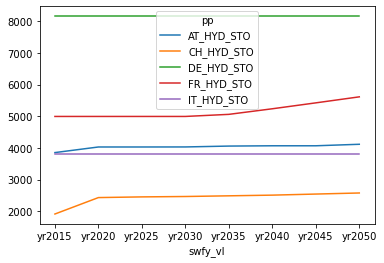

In [22]:
slct_run_id = def_run.query('swfz_vl == "default" and swec_vl == "early_bat" and swst_vl == "000%"').run_id.tolist()

df_cap = mps.id_to_name(ddf_from_parquet('par_cap_pwr_leg*', slct_run_id=slct_run_id).query(f'pp_id in {list(mps.pp2pp("HYD_STO"))}').compute())
df_cap.pivot_table(index='swfy_vl', columns='pp', values='value').plot()

# Model results consistency check
* Analysing various aspects of the model results to ensure that they meet expectations
* Not included in the paper

In [110]:
# Read all hourly power
ddf_var_sy_pwr = ddf_from_parquet('var_sy_pwr*')
# Aggregate energy over the whole year
df_pp_sum = ddf_var_sy_pwr.groupby(['run_id', 'pp_id', 'bool_out']).value.sum().compute().reset_index()

In [19]:
# Add time columns to hourly data
df_tm = pd.read_parquet(sc_out + 'tm_soy_full.parq').set_index('sy')[['hour']]
ddf_var_sy_pwr_hourly = ddf_var_sy_pwr.join(df_tm, on='sy')
# Group and sum by hour-of-the-day
group_cols = ['pp_id', 'bool_out', 'hour', 'ca_id', 'run_id']
ddf_var_sy_pwr_hourly = (ddf_var_sy_pwr_hourly.groupby(group_cols).value.sum())
df_var_sy_pwr_hourly = ddf_var_sy_pwr_hourly.compute()
df_var_sy_pwr_hourly = mps.id_to_name(df_var_sy_pwr_hourly.reset_index())

df_var_sy_pwr_hourly.head()

,pp_id,bool_out,hour,ca_id,run_id,value,nd_id,pt_id,fl_id,pp,...,swec_id,swch_id,swfy_vl,swfz_vl,swst_vl,swec_vl,swch_vl,nd,pt,fl
0,0,False,0,0,0,7259.490644,2,0,12,DE_HYD_RES,...,0,0,yr2015,default,000%,early_phs,default,DE0,HYD_RES,reservoir
1,0,False,1,0,0,9053.900267,2,0,12,DE_HYD_RES,...,0,0,yr2015,default,000%,early_phs,default,DE0,HYD_RES,reservoir
2,0,False,2,0,0,22518.814830,2,0,12,DE_HYD_RES,...,0,0,yr2015,default,000%,early_phs,default,DE0,HYD_RES,reservoir
3,0,False,3,0,0,47106.686535,2,0,12,DE_HYD_RES,...,0,0,yr2015,default,000%,early_phs,default,DE0,HYD_RES,reservoir
4,0,False,4,0,0,134063.205417,2,0,12,DE_HYD_RES,...,0,0,yr2015,default,000%,early_phs,default,DE0,HYD_RES,reservoir


In [20]:
# Read power plant capacities
ddf_cap_sum = ddf_from_parquet('var_yr_cap_pwr_tot*')
df_cap_sum = ddf_cap_sum.compute()
# Read storage energy capacity
ddf_caperg_sum = ddf_from_parquet('var_yr_cap_erg_tot*')
# Read discharge duration parameter
ddf_dischdur = ddf_from_parquet('par_disch*')
# Merge energy capacity and discharge duration
ddf_caperg_sum = dd.merge(ddf_caperg_sum, ddf_dischdur, on=['pp_id', 'ca_id', 'run_id'], 
                          suffixes=('caperg', 'discharge'), how='left')
df_caperg_sum = ddf_caperg_sum.compute()

In [54]:
# Translate ids of power plant, node, run, etc to corresponding names
df_pp_sum = mps.id_to_name(df_pp_sum.reset_index())
df_cap_sum = mps.id_to_name(df_cap_sum.reset_index())
df_caperg_sum = mps.id_to_name(df_caperg_sum)
df_pp_sum.head()

ValueError: columns overlap but no suffix specified: Index(['swfy_id', 'swfz_id', 'swst_id', 'swec_id', 'swch_id', 'swfy_vl',
       'swfz_vl', 'swst_vl', 'swec_vl', 'swch_vl'],
      dtype='object')

## Default; future scenarios
* No additional storage
* Default scenario (change both fuel prices and capacities)

In [55]:
slct_run_id = def_run.loc[def_run.swfz_vl.isin(['default'])
                       & def_run.swst_vl.isin(['000%'])
                       & def_run.swec_vl.isin(['early_phs'])].run_id.tolist()
df_pp_sum_default = df_pp_sum.loc[df_pp_sum.run_id.isin(slct_run_id)]
df_cap_sum_default = df_cap_sum.loc[df_cap_sum.run_id.isin(slct_run_id)]
df_pp_sum_default.loc[df_pp_sum_default.bool_out, 'value'] *= -1

In [56]:
data = df_pp_sum_default.assign(value=df_pp_sum_default.value / 1e6)
fig = px.bar(data.sort_values(['swfy_vl', 'nd']), x='swfy_vl', y='value', hover_data=['pt'],
       facet_col='nd', color='fl',
       labels={'value': 'Energy (TWh/yr)', 'swfy_vl': 'Year'})
fig.update_yaxes(matches=None)

In [57]:
data = df_cap_sum_default.assign(value=df_cap_sum_default.value / 1e3)
fig = px.bar(data.query('pt != "LOL_LIN"').sort_values(['swfy_vl', 'nd']), 
             x='swfy_vl', y='value', hover_data=['pt'],
             facet_col='nd', color='fl', 
             labels={'value': 'Installed capacity (GW)', 'swfy_vl': 'Year'})
fig.update_yaxes(matches=None)

## Impact of swst_vl

In [66]:
slct_run_id = def_run.loc[def_run.swfz_vl.isin(['default'])
                        & def_run.swec_vl.isin(['early_phs'])
                        & def_run.swfy_vl.isin(['yr2015', 'yr2050'])].run_id.tolist()
print(slct_run_id)
df_pp_sum_swst = df_pp_sum.loc[df_pp_sum.run_id.isin(slct_run_id)]
df_pp_sum_swst.loc[df_pp_sum_swst.bool_out, 'value'] *= -1

df_pp_sum_swst

[4, 28, 52, 76, 100, 124, 148, 172, 196, 220, 244, 268, 292, 316, 340, 364, 388, 412, 436, 460, 484, 508, 532, 556, 580, 604, 628, 652, 676, 700, 724, 0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672, 696, 720]


,index,run_id,pp_id,bool_out,value,nd_id,pt_id,fl_id,swfy_id,swfz_id,...,swch_id,swfy_vl,swfz_vl,swst_vl,swec_vl,swch_vl,pp,nd,pt,fl
0,0,0,0,False,3.671570e+06,2,0,12,0,0,...,0,yr2015,default,000%,early_phs,default,DE_HYD_RES,DE0,HYD_RES,reservoir
1,1,0,1,False,1.511803e+07,0,0,12,0,0,...,0,yr2015,default,000%,early_phs,default,AT_HYD_RES,AT0,HYD_RES,reservoir
2,2,0,2,False,2.201464e+07,1,0,12,0,0,...,0,yr2015,default,000%,early_phs,default,CH_HYD_RES,CH0,HYD_RES,reservoir
3,3,0,3,False,2.683357e+07,4,0,12,0,0,...,0,yr2015,default,000%,early_phs,default,IT_HYD_RES,IT0,HYD_RES,reservoir
4,4,0,4,False,2.088421e+07,3,0,12,0,0,...,0,yr2015,default,000%,early_phs,default,FR_HYD_RES,FR0,HYD_RES,reservoir
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73945,73945,724,86,True,-7.538975e+07,0,19,25,4,0,...,0,yr2050,default,300%,early_phs,default,AT0_DMND,AT0,DMND,dmnd
73946,73946,724,87,True,-6.747222e+07,1,19,25,4,0,...,0,yr2050,default,300%,early_phs,default,CH0_DMND,CH0,DMND,dmnd
73947,73947,724,88,True,-6.194383e+08,2,19,25,4,0,...,0,yr2050,default,300%,early_phs,default,DE0_DMND,DE0,DMND,dmnd
73948,73948,724,89,True,-5.871314e+08,3,19,25,4,0,...,0,yr2050,default,300%,early_phs,default,FR0_DMND,FR0,DMND,dmnd


In [67]:
## Impact by swst_vl

join_cols = list(set(sw_cols) - {'swst_vl'} | {'bool_out', 'pp_id'})

data = df_pp_sum_swst.query('bool_out == False').assign(value=lambda x: x.value / 1e6)
data_ref = data.loc[data.swst_vl == '000%'].set_index(join_cols).value.rename('value_ref')
data = data.join(data_ref, on=join_cols).assign(value_diff=lambda x: x.value - x.value_ref)
data

,index,run_id,pp_id,bool_out,value,nd_id,pt_id,fl_id,swfy_id,swfz_id,...,swfz_vl,swst_vl,swec_vl,swch_vl,pp,nd,pt,fl,value_ref,value_diff
0,0,0,0,False,3.671570,2,0,12,0,0,...,default,000%,early_phs,default,DE_HYD_RES,DE0,HYD_RES,reservoir,3.671570,0.000000
1,1,0,1,False,15.118029,0,0,12,0,0,...,default,000%,early_phs,default,AT_HYD_RES,AT0,HYD_RES,reservoir,15.118029,0.000000
2,2,0,2,False,22.014639,1,0,12,0,0,...,default,000%,early_phs,default,CH_HYD_RES,CH0,HYD_RES,reservoir,22.014639,0.000000
3,3,0,3,False,26.833571,4,0,12,0,0,...,default,000%,early_phs,default,IT_HYD_RES,IT0,HYD_RES,reservoir,26.833571,0.000000
4,4,0,4,False,20.884210,3,0,12,0,0,...,default,000%,early_phs,default,FR_HYD_RES,FR0,HYD_RES,reservoir,20.884210,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73935,73935,724,80,False,17.032588,0,18,24,4,0,...,default,300%,early_phs,default,AT0_TRNS,AT0,TRNS,exchange,16.092731,0.939857
73937,73937,724,81,False,34.133879,2,18,24,4,0,...,default,300%,early_phs,default,DE0_TRNS,DE0,TRNS,exchange,34.912059,-0.778180
73939,73939,724,83,False,8.129820,3,18,24,4,0,...,default,300%,early_phs,default,FR0_TRNS,FR0,TRNS,exchange,7.938610,0.191210
73941,73941,724,84,False,37.783141,4,18,24,4,0,...,default,300%,early_phs,default,IT0_TRNS,IT0,TRNS,exchange,35.473819,2.309323


In [73]:
fig = px.bar(data, x='swst_vl', y='value_diff', 
          hover_data=['fl', 'bool_out', 'run_id'] + sw_cols,
             facet_col='nd', facet_row='swfy_vl', color='fl', 
             labels={'value': 'Installed capacity (GW)', 'swfy_vl': 'Year'})
fig.update_yaxes(matches=None)

## Verify frozen capacity
* Verify that all capacity is constant at the 2015 level in the `frz_cap` case ("frozen capacity", only fuel prices are changed)

In [76]:
slct_run_id = def_run.query('swst_vl in ["000%", "050%"] '
                            ' and swfy_vl in ["yr2015", "yr2030", "yr2050"]').run_id.tolist()
dfcap = (ddf_from_parquet('par_cap_pwr_leg*', slct_run_id=slct_run_id)
                 .assign(pt_id=lambda x: x.pp_id.replace(mps.dict_plant_2_pp_type_id))
                 .groupby(['run_id', 'pt_id']).value.sum().reset_index()
                 .compute())
dfcap = dfcap.loc[~dfcap.pt_id.isin(mps.pt2pt('LOL'))]
dfcap = mps.id_to_name(dfcap)

dfcap['run_no_fz'] = dfcap[set(sw_cols) - {'swfz_vl', 'swst_vl'}].apply(tuple, axis=1).astype(str)
dfcap

px.bar(dfcap, x='run_no_fz', y='value', color='pt', facet_col='swfz_vl', facet_row='swst_vl')

## Verify frozen prices
* Verify that all prices are constant at the 2015 level in the `frz_vc` case ("frozen prices", only capacities are changed)

In [83]:
slct_run_id = def_run.query('swst_vl in ["000%", "050%"] '
                            ' and swfy_vl in ["yr2015", "yr2030", "yr2050"]'
                            ' and swec_vl in ["early_bat"]').run_id.tolist()
dfvcfl = ddf_from_parquet('par_vc_fl*', slct_run_id=slct_run_id)
dfvcfl = dfvcfl.loc[~dfvcfl.fl_id.isin(mps.fl2fl('lost'))
                   & dfvcfl.nd_id.isin([2])]
dfvcfl = dfvcfl.loc[dfvcfl.mt_id == 0].compute()
dfvcfl = mps.id_to_name(dfvcfl)

dfvcfl['run_no_fz'] = dfvcfl[set(sw_cols) - {'swfz_vl', 'swst_vl', 'swfy_vl'}].apply(tuple, axis=1).astype(str)
dfvcfl

fig = px.line(dfvcfl, x='swfy_vl', y='value', color='fl', 
             facet_col='swfz_vl', facet_row='swst_vl')
fig#.update_layout(barmode='group')


## Verify new storage capacity as expected

In [107]:
slct_run_id = def_run.query('swfy_vl in ["yr2015", "yr2030", "yr2050"]').run_id.tolist()
dfcap = ddf_from_parquet('var_yr_cap_erg_tot*', slct_run_id=slct_run_id)
dfcap = dfcap.loc[dfcap.pp_id.isin(mps.pp2pp('STO'))].compute()

dfcap['pt_id'] = dfcap.pp_id.replace(mps.dict_plant_2_pp_type_id)
dfcap['nd_id'] = dfcap.pp_id.replace(mps.dict_plant_2_node_id)

dfcap = (dfcap.pivot_table(index=['run_id', 'nd_id'], columns='pt_id', values='value')
              .assign(value= lambda x: x[mps.dict_pt_id['NEW_STO']] / x[mps.dict_pt_id['HYD_STO']])
              .reset_index())[['run_id', 'nd_id', 'value']]
dfcap = mps.id_to_name(dfcap)

px.scatter(dfcap, x='swst_vl', y='value', facet_col='nd', height=300,
           labels={'value': 'Ratio energy capacity BAT/PHS',
                   'swst_vl': 'New storage penetration (%)'})

# Other analyses
* Exploratory; not used in the paper

## Statistical analysis of daily residual load/price profiles
* analyze daily profiles with respect to ratios/differences of night/day/morning/evening time slots
* assess the feasibility of a direct statistical comparison with  the SymEnergy result
* conclusion: not feasible; too narrow range in the $(l_\mathrm{mor}, l_\mathrm{day})$ space covered, insufficient statistics for each bin

In [35]:
list_run_id = def_run.query('swst_vl == "000%" and swec_vl == "early_phs" and swfz_vl == "default"').run_id.tolist()
ddfmc = ddf_from_parquet('dual_supply*', columns=['sy', 'nd_id', 'run_id', 'value'], slct_run_id=list_run_id)
ddfmc = ddf_add_tm_cols(ddfmc, ['hour', 'doy', 'season'])
dfmc = ddfmc.loc[ddfmc.nd_id == mps.dict_nd_id['CH0']].compute()
dfmc = mps.id_to_name(dfmc).rename(columns={'value': 'mc'})

ddfresdmnd = ddf_from_parquet('var_sy_pwr*', columns=['sy', 'pp_id', 'run_id', 'value'], slct_run_id=list_run_id)
ddfresdmnd = ddfresdmnd.loc[ddfresdmnd.pp_id.isin(mps.pp2pp('DMND|SOL|WIN') - mps.pp2pp('FLEX'))]
ddfresdmnd = ddf_add_tm_cols(ddfresdmnd, ['hour', 'doy', 'season'])
ddfresdmnd['pt_id'] = ddfresdmnd.pp_id.replace(mps.dict_plant_2_pp_type_id)
ddfresdmnd = ddfresdmnd.groupby(['sy', 'hour', 'doy', 'season', 'pt_id', 'run_id']).value.sum()

dfresdmnd = mps.id_to_name(ddfresdmnd.compute().reset_index())
dfresdmnd = dfresdmnd.assign(ptype=lambda x: x.pt.replace({'WIN_ONS': 'VRE', 'WIN_OFF': 'VRE', 'SOL_PHO': 'VRE'}))

In [36]:
dfresdmndpv = dfresdmnd.pivot_table(index=['swfy_vl', 'hour', 'season', 'doy'], columns='ptype', 
                           values='value', aggfunc=[sum, len]
                          )
assert tuple(dfresdmndpv['len'].max()) == (1,3), 'aggregating too many'
dfresdmndpv = dfresdmndpv['sum'].reset_index()
dfresdmndpv['res_dmnd'] = dfresdmndpv.DMND - dfresdmndpv.VRE
dfresdmndpv.drop(['DMND', 'VRE'], axis=1, inplace=True)

### Distribution of residual load by hour of the day

In [37]:
fig = px.box(dfresdmndpv, x='hour', y="res_dmnd", facet_col="swfy_vl", facet_row='season')
fig

### Distribution of marginal costs by hour of the day

In [39]:
fig = px.box(dfmc.sort_values('swfy_vl'), x='hour', y="mc", facet_col="swfy_vl", facet_row='season')
fig

### Calculation of differences/ratios between the four coarse day times

In [43]:
# select representative night, morning, day, and evening time slots in line with the profile shapes above
dict_slots = {'nig': [2,3], 'mor': [7,8], 'day': [11, 12], 'eve': [17, 18]}

In [44]:
# calculate average residual demand based on hour selection in dict_slots
dfgp = dfresdmndpv[['doy', 'hour', 'swfy_vl', 'res_dmnd']].groupby(['doy', 'swfy_vl'])

def get_average_resdmnd(x):
    return pd.Series({slot: x.set_index('hour').loc[list_hour].res_dmnd.mean() for slot, list_hour in dict_slots.items()})

dfresdmnd_avg = dfgp.apply(get_average_resdmnd).reset_index()

In [45]:
dfgp = dfresdmndpv[['doy', 'hour', 'swfy_vl', 'res_dmnd']].groupby(['doy', 'swfy_vl'])

In [46]:
def calc_ratio_diff(x, s1, s2, diff_ratio):
    return x[s1] / x[s2] if diff_ratio == 'ratio' else x[s1] - x[s2]

dfresdmnd_avg = dfresdmnd_avg.assign(**{f'{diff_ratio}_{s1}_{s2}': 
                                functools.partial(calc_ratio_diff, s1=s1, s2=s2, diff_ratio=diff_ratio)
                        for s1, s2 in [('mor', 'nig'), ('day', 'nig'), ('eve', 'nig')]
                        for diff_ratio in ['diff', 'ratio']
                        if not s1 == s2})

dfresdmnd_avg = (dfresdmnd_avg.join(df_tm_soy_full[['doy', 'dow_type', 'dow', 'season']]
                                            .drop_duplicates()
                                            .set_index('doy'), on='doy'))


In [48]:
fig = px.box(dfresdmnd_avg, x='season', y="ratio_day_nig", facet_col='swfy_vl')
fig

#### 2D plot of counts at certain differences day-night and morning-night

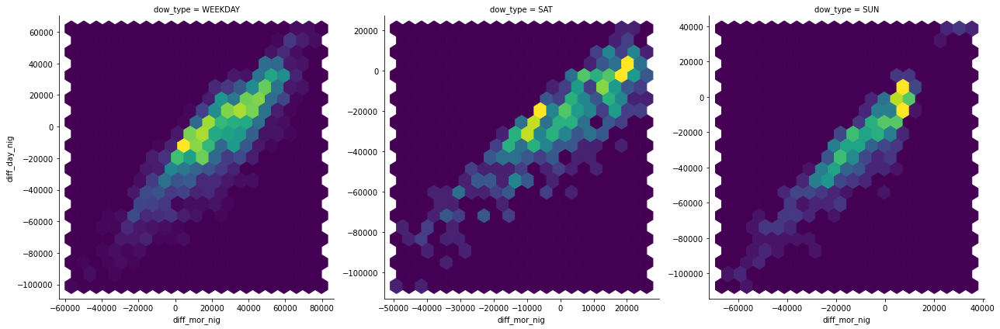

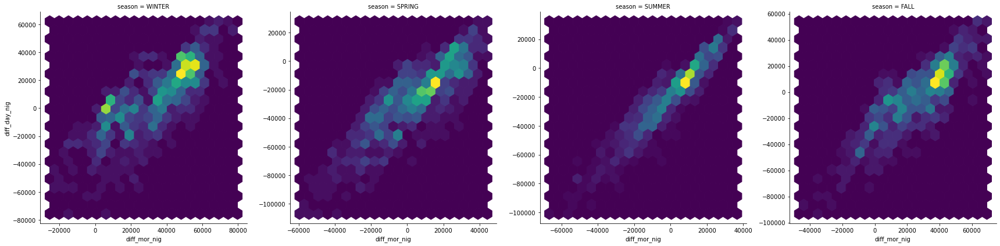

In [54]:
def hexbin(x, y, color, **kwargs):
    plt.hexbin(x, y, gridsize=20, **kwargs)

g = sns.FacetGrid(dfresdmnd_avg, col="dow_type", size=6, sharex=False, sharey=False)
g.map(hexbin, "diff_mor_nig", "diff_day_nig")

g = sns.FacetGrid(dfresdmnd_avg, col="season", size=6, sharex=False, sharey=False)
g.map(hexbin, "diff_mor_nig", "diff_day_nig")

#### Histograms of ratios and differences

In [56]:
fig = make_subplots(rows=2, cols=2)

dict_slct = {(1, 1): ('Ratio day/night', 'ratio_day_nig'),
             (2, 1): ('Difference day - night', 'diff_day_nig'),
             (1, 2): ('Ratio morning/night', 'ratio_mor_nig'),
             (2, 2): ('Difference mor - night', 'diff_mor_nig')}

for (col, row), (xname, datacol) in dict_slct.items():
    for dt in [ 'SUN', 'SAT', 'WEEKDAY']:
        x = df_2d_diffs.query(f'dow_type == "{dt}"')
        fig.add_trace(go.Histogram(x=x[datacol], name=dt), col=col, row=row)
    fig.update_xaxes(title_text=xname, row=row, col=col)    
    
fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.3)
fig.show()